In [29]:
import os
import random
import rasterio

def analyze_tiff_subset(base_dir, num_samples=3):
    """
    Randomly samples location directories to analyze matching HR (5m) and LR (10m) TIFFs.
    Accounts for the 'b2b3b4b8' band folder and '.tiff' extensions.
    """
    # Get all location directories in the base folder
    locations = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

    if not locations:
        print(f"No location directories found in {base_dir}")
        return

    sampled_locs = random.sample(locations, min(num_samples, len(locations)))

    for loc in sampled_locs:
        print(f"\n{'='*50}\nAnalyzing Location: {loc}\n{'='*50}")

        # Updated paths to include 'b2b3b4b8'
        dir_5m = os.path.join(base_dir, loc, 'b2b3b4b8', '05m')
        dir_10m = os.path.join(base_dir, loc, 'b2b3b4b8', '10m')

        if os.path.exists(dir_5m) and os.listdir(dir_5m):
            # Look for .tiff (or .tif) files
            images_5m = [f for f in os.listdir(dir_5m) if f.lower().endswith(('.tif', '.tiff'))]

            if not images_5m:
                print(f"No TIFF images found in {dir_5m}")
                continue

            sample_img_5m = random.choice(images_5m)
            sample_img_10m = sample_img_5m.replace('_05m', '_10m')

            path_5m = os.path.join(dir_5m, sample_img_5m)
            path_10m = os.path.join(dir_10m, sample_img_10m)

            for path, res_label in [(path_5m, 'High-Res (5m)'), (path_10m, 'Low-Res (10m)')]:
                if not os.path.exists(path):
                    print(f"File not found: {path}")
                    continue

                with rasterio.open(path) as src:
                    img_array = src.read()
                    profile = src.profile

                    print(f"--- {res_label} File: {os.path.basename(path)} ---")
                    print(f"Data Type: {profile['dtype']}")
                    print(f"Shape (Bands, Height, Width): {img_array.shape}")

                    for band_idx in range(img_array.shape[0]):
                        band_data = img_array[band_idx]
                        print(f"  Band {band_idx + 1}: "
                              f"Min = {band_data.min():.2f}, "
                              f"Max = {band_data.max():.2f}, "
                              f"Mean = {band_data.mean():.2f}, "
                              f"Std = {band_data.std():.2f}")
        else:
            print(f"Path does not exist or is empty: {dir_5m}")

# Usage:
base_dir = r"D:\SUPARCO\SEN2VENµS"
analyze_tiff_subset(base_dir, num_samples=3)


Analyzing Location: KUDALIAR
--- High-Res (5m) File: KUDALIAR_411_2020-08-31_44QKE_b2b3b4b8_05m.tif ---
Data Type: int16
Shape (Bands, Height, Width): (4, 256, 256)
  Band 1: Min = 207.00, Max = 1269.00, Mean = 432.18, Std = 119.97
  Band 2: Min = 393.00, Max = 1763.00, Mean = 799.51, Std = 192.70
  Band 3: Min = 195.00, Max = 2444.00, Mean = 738.00, Std = 372.87
  Band 4: Min = 255.00, Max = 4948.00, Mean = 3356.75, Std = 640.86
--- Low-Res (10m) File: KUDALIAR_411_2020-08-31_44QKE_b2b3b4b8_10m.tif ---
Data Type: int16
Shape (Bands, Height, Width): (4, 128, 128)
  Band 1: Min = 234.00, Max = 1207.00, Mean = 422.55, Std = 116.07
  Band 2: Min = 386.00, Max = 1712.00, Mean = 781.79, Std = 189.41
  Band 3: Min = 252.00, Max = 2506.00, Mean = 722.54, Std = 368.07
  Band 4: Min = 433.00, Max = 5071.00, Mean = 3315.92, Std = 635.64

Analyzing Location: ALSACE
--- High-Res (5m) File: ALSACE_152_2019-09-15_32ULU_b2b3b4b8_05m.tif ---
Data Type: int16
Shape (Bands, Height, Width): (4, 256, 256


Plotting Location: FR-LAM


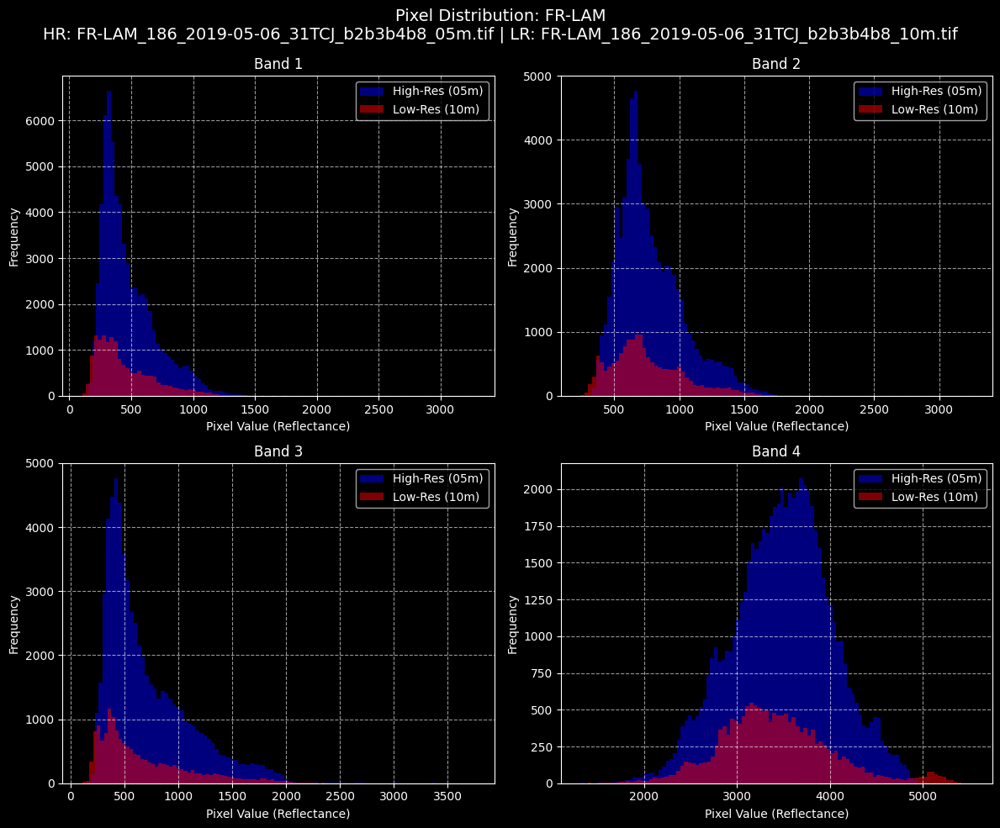


Plotting Location: SUDOUE-6


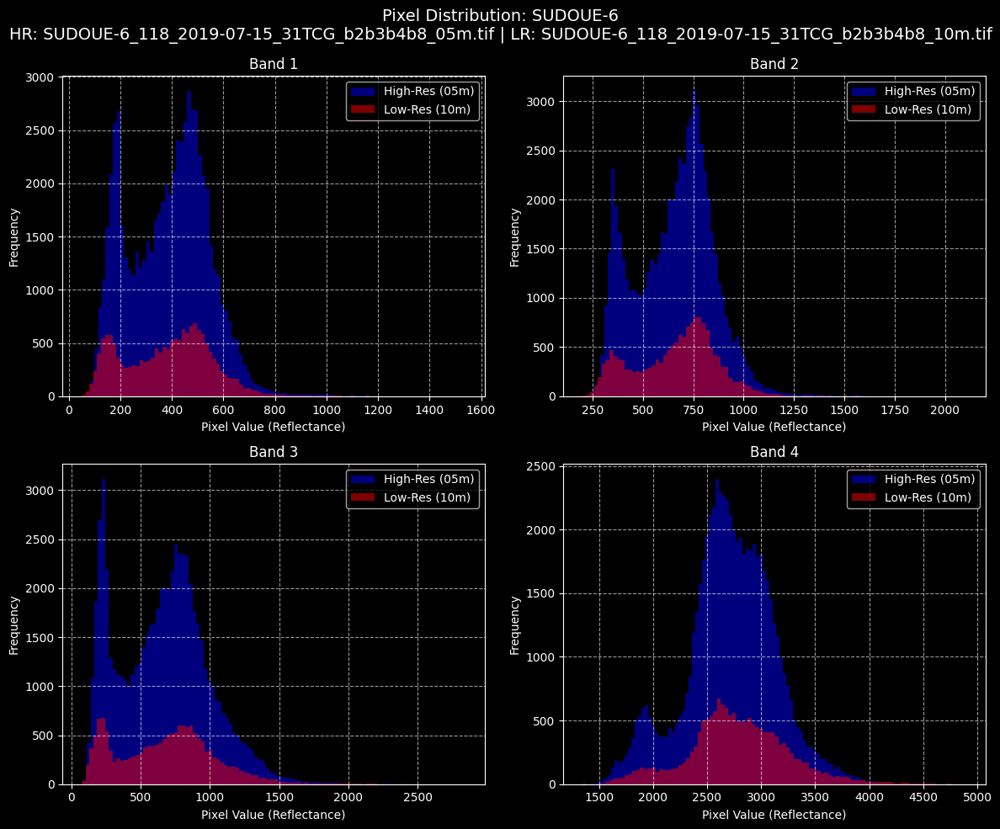


Plotting Location: BAMBENW2


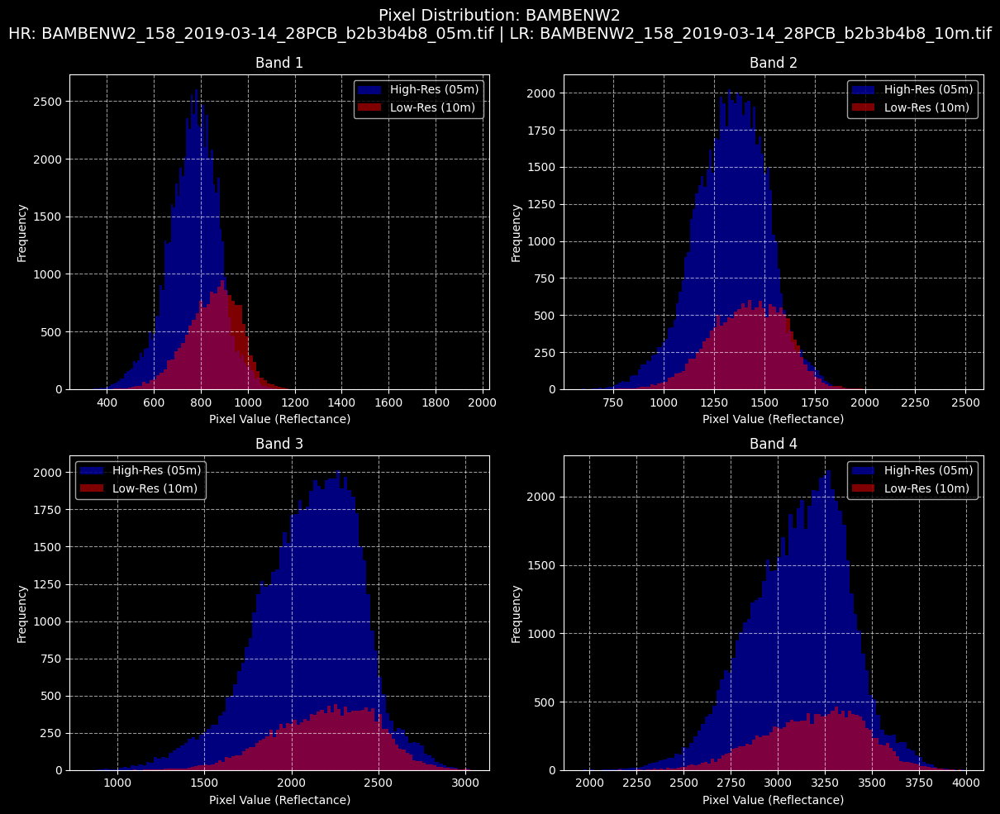

In [30]:
import os
import random
import rasterio
import matplotlib.pyplot as plt
import numpy as np

def plot_tiff_histograms(base_dir, num_samples=1):
    """
    Randomly samples location directories and plots overlapping histograms
    for the matching HR (5m) and LR (10m) TIFFs across all bands.
    """
    locations = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

    if not locations:
        print(f"No location directories found in {base_dir}")
        return

    # Usually, 1 or 2 samples is enough for visualization so we don't spawn too many windows
    sampled_locs = random.sample(locations, min(num_samples, len(locations)))

    for loc in sampled_locs:
        print(f"\nPlotting Location: {loc}")

        dir_5m = os.path.join(base_dir, loc, 'b2b3b4b8', '05m')
        dir_10m = os.path.join(base_dir, loc, 'b2b3b4b8', '10m')

        if os.path.exists(dir_5m) and os.listdir(dir_5m):
            images_5m = [f for f in os.listdir(dir_5m) if f.lower().endswith(('.tif', '.tiff'))]

            if not images_5m:
                print(f"No TIFF images found in {dir_5m}")
                continue

            sample_img_5m = random.choice(images_5m)
            sample_img_10m = sample_img_5m.replace('_05m', '_10m')

            path_5m = os.path.join(dir_5m, sample_img_5m)
            path_10m = os.path.join(dir_10m, sample_img_10m)

            if not (os.path.exists(path_5m) and os.path.exists(path_10m)):
                print(f"File mismatch or not found for {sample_img_5m}. Skipping...")
                continue

            with rasterio.open(path_5m) as src_hr, rasterio.open(path_10m) as src_lr:
                hr_array = src_hr.read()
                lr_array = src_lr.read()

            num_bands = hr_array.shape[0]

            # Create a 2x2 grid of subplots (perfect for b2, b3, b4, b8)
            fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))
            fig.suptitle(f"Pixel Distribution: {loc}\nHR: {sample_img_5m} | LR: {sample_img_10m}", fontsize=14)
            axes = axes.flatten()

            for i in range(min(num_bands, 4)):
                # Flatten the 2D arrays into 1D for histogram generation
                hr_band_flat = hr_array[i].flatten()
                lr_band_flat = lr_array[i].flatten()

                # Plotting both on the same axis with alpha (transparency) to see overlaps
                axes[i].hist(hr_band_flat, bins=100, alpha=0.5, label='High-Res (05m)', color='blue')
                axes[i].hist(lr_band_flat, bins=100, alpha=0.5, label='Low-Res (10m)', color='red')

                axes[i].set_title(f"Band {i + 1}")
                axes[i].set_xlabel("Pixel Value (Reflectance)")
                axes[i].set_ylabel("Frequency")
                axes[i].legend()
                axes[i].grid(True, linestyle='--', alpha=0.6)

            plt.tight_layout()
            plt.subplots_adjust(top=0.90) # Leave room for the main title
            plt.show()

        else:
            print(f"Path does not exist or is empty: {dir_5m}")

# Usage:
base_dir = r"D:\SUPARCO\SEN2VENµS"
plot_tiff_histograms(base_dir, num_samples=3)

In [31]:
import os
import random
import rasterio

def verify_16bit_signed(base_dir, num_samples=5):
    """
    Checks if the TIFF files are stored as 16-bit signed integers (int16)
    and verifies if any negative values actually exist in the data.
    """
    locations = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]

    if not locations:
        print(f"No location directories found in {base_dir}")
        return

    sampled_locs = random.sample(locations, min(num_samples, len(locations)))

    print(f"{'='*50}\nChecking Data Types for {len(sampled_locs)} Samples\n{'='*50}")

    for loc in sampled_locs:
        dir_5m = os.path.join(base_dir, loc, 'b2b3b4b8', '05m')

        if os.path.exists(dir_5m) and os.listdir(dir_5m):
            images_5m = [f for f in os.listdir(dir_5m) if f.lower().endswith(('.tif', '.tiff'))]

            if not images_5m:
                continue

            sample_img = random.choice(images_5m)
            path = os.path.join(dir_5m, sample_img)

            with rasterio.open(path) as src:
                # Get the reported data type from the TIFF metadata
                reported_dtype = src.profile['dtype']
                is_signed_16 = (reported_dtype == 'int16')

                # Read the actual array to check for negative values
                img_array = src.read()
                actual_min = img_array.min()
                actual_max = img_array.max()

                print(f"Location: {loc}")
                print(f"File: {sample_img}")
                print(f"  Metadata dtype: {reported_dtype} -> "
                      f"{'✅ Matches int16' if is_signed_16 else '❌ Does NOT match int16'}")
                print(f"  Actual Min Value: {actual_min}")
                print(f"  Actual Max Value: {actual_max}")

                # Check if negatives are used (often used for NoData masks in remote sensing)
                if actual_min < 0:
                    print(f"  ⚠️ Note: Negative values detected. (Often represents NoData/padding)")
                else:
                    print(f"  ℹ️ Note: No negative values found in this specific image.")
                print("-" * 50)

# Usage:
base_dir = r"D:\SUPARCO\SEN2VENµS"
verify_16bit_signed(base_dir, num_samples=100)

Checking Data Types for 29 Samples
Location: FR-BIL
File: FR-BIL_441_2019-08-22_30TXQ_b2b3b4b8_05m.tif
  Metadata dtype: int16 -> ✅ Matches int16
  Actual Min Value: -87
  Actual Max Value: 4500
  ⚠️ Note: Negative values detected. (Often represents NoData/padding)
--------------------------------------------------
Location: ESGISB-2
File: ESGISB-2_357_2020-05-28_30TXQ_b2b3b4b8_05m.tif
  Metadata dtype: int16 -> ✅ Matches int16
  Actual Min Value: 88
  Actual Max Value: 4566
  ℹ️ Note: No negative values found in this specific image.
--------------------------------------------------
Location: SO2
File: SO2_12_2020-07-09_31TCJ_b2b3b4b8_05m.tif
  Metadata dtype: int16 -> ✅ Matches int16
  Actual Min Value: 200
  Actual Max Value: 4837
  ℹ️ Note: No negative values found in this specific image.
--------------------------------------------------
Location: LERIDA-1
File: LERIDA-1_116_2020-06-29_31TCG_b2b3b4b8_05m.tif
  Metadata dtype: int16 -> ✅ Matches int16
  Actual Min Value: -76
  Actu

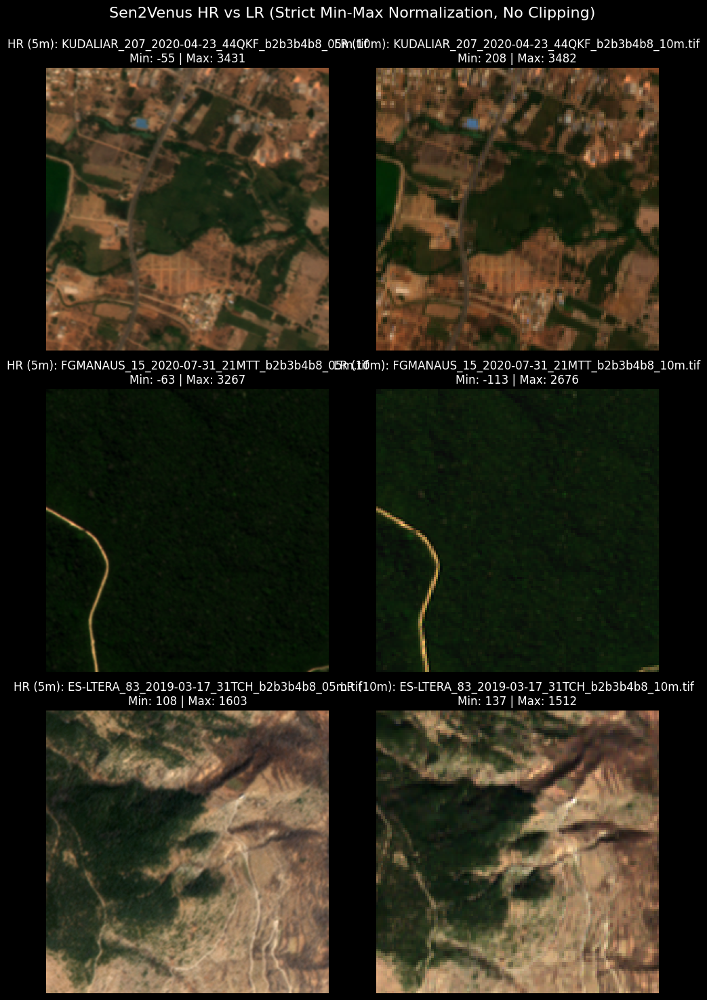

In [32]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def display_rgb_image_no_clipping(ax, img_array, title):
    # Sentinel-2 b2b3b4b8 order: 0=Blue, 1=Green, 2=Red, 3=NIR
    # To display RGB, we need Red (2), Green (1), Blue (0)
    rgb = np.stack((img_array[2], img_array[1], img_array[0]), axis=-1).astype(np.float32)

    # Perform strict Min-Max scaling to avoid any clipping
    img_min = rgb.min()
    img_max = rgb.max()

    if img_max > img_min:
        rgb_normalized = (rgb - img_min) / (img_max - img_min)
    else:
        rgb_normalized = np.zeros_like(rgb) # Fallback if image is completely flat

    ax.imshow(rgb_normalized)

    # Adding the min/max to the title so you can verify it
    ax.set_title(f"{title}\nMin: {img_min:.0f} | Max: {img_max:.0f}")
    ax.axis('off')

def visualize_specific_pairs(base_dir, specific_files):
    fig, axes = plt.subplots(nrows=len(specific_files), ncols=2, figsize=(10, 5 * len(specific_files)))
    fig.suptitle("Sen2Venus HR vs LR (Strict Min-Max Normalization, No Clipping)", fontsize=16)

    # Ensure axes is 2D even if there's only one file
    if len(specific_files) == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, file_info in enumerate(specific_files):
        loc = file_info['loc']
        name_5m = file_info['name_5m']
        name_10m = name_5m.replace('_05m', '_10m')

        path_5m = os.path.join(base_dir, loc, 'b2b3b4b8', '05m', name_5m)
        path_10m = os.path.join(base_dir, loc, 'b2b3b4b8', '10m', name_10m)

        with rasterio.open(path_5m) as src_hr:
            hr_array = src_hr.read()

        with rasterio.open(path_10m) as src_lr:
            lr_array = src_lr.read()

        display_rgb_image_no_clipping(axes[i, 0], hr_array, f"HR (5m): {name_5m}")
        display_rgb_image_no_clipping(axes[i, 1], lr_array, f"LR (10m): {name_10m}")

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

# Base directory
base_dir = r"D:\SUPARCO\SEN2VENµS"

# The specific files with negative values and one normal one
files_to_check = [
    {'loc': 'KUDALIAR', 'name_5m': 'KUDALIAR_207_2020-04-23_44QKF_b2b3b4b8_05m.tif'},
    {'loc': 'FGMANAUS', 'name_5m': 'FGMANAUS_15_2020-07-31_21MTT_b2b3b4b8_05m.tif'},
    {'loc': 'ES-LTERA', 'name_5m': 'ES-LTERA_83_2019-03-17_31TCH_b2b3b4b8_05m.tif'}
]

visualize_specific_pairs(base_dir, files_to_check)

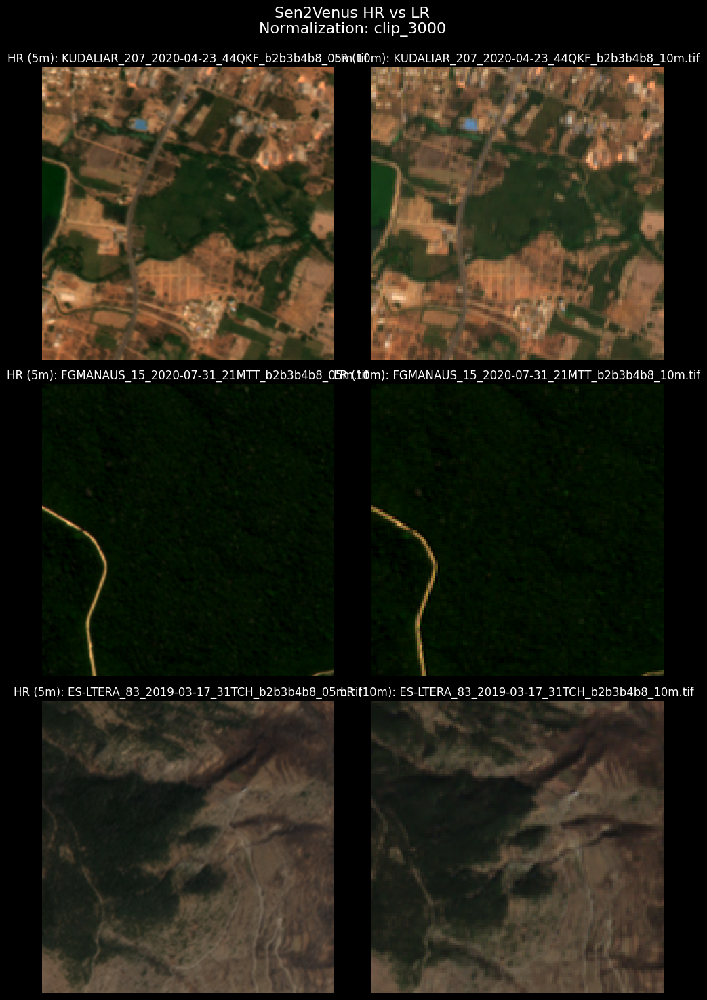

In [33]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# Normalization Methods
# ==========================================

def norm_clip_3000(img_array):
    """Method 1: Clip negatives to 0, stretch max to 3000."""
    # Extract RGB (Bands 2, 1, 0)
    rgb = np.stack((img_array[2], img_array[1], img_array[0]), axis=-1).astype(np.float32)
    rgb = np.clip(rgb, 0, 3000)
    return rgb / 3000.0  # Scale to 0-1 for matplotlib

def norm_div_10000(img_array):
    """Method 2: Divide by 10000 as per the Sen2Venus paper."""
    rgb = np.stack((img_array[2], img_array[1], img_array[0]), axis=-1).astype(np.float32)
    # The paper divides by 10000 to get true reflectance (0.0 to 1.0).
    # We clip at 0.0 (no negative reflectance) and 1.0 (for matplotlib display limits).
    rgb = np.clip(rgb / 10000.0, 0.0, 1.0)
    return rgb

def norm_percentile_8bit(img_array):
    """Method 3: 2nd and 98th percentile clipping, scaled to 8-bit (0-255)."""
    rgb = np.stack((img_array[2], img_array[1], img_array[0]), axis=-1).astype(np.float32)

    # Calculate the 2nd and 98th percentiles across the whole RGB image
    p_low, p_high = np.percentile(rgb, (2, 98))

    # Clip the outliers
    rgb_clipped = np.clip(rgb, p_low, p_high)

    # Scale strictly to 0-255 and convert to 8-bit unsigned integer
    rgb_8bit = ((rgb_clipped - p_low) / (p_high - p_low) * 255).astype(np.uint8)
    return rgb_8bit

def norm_percentile_8bitLessContrast(img_array):
    """Method 4: 2nd/98th percentile clipping, scaled to [5, 250] for less contrast."""
    rgb = np.stack((img_array[2], img_array[1], img_array[0]), axis=-1).astype(np.float32)

    p_low, p_high = np.percentile(rgb, (2, 98))

    # Prevent division by zero if the image is entirely flat
    if p_high == p_low:
        return np.full_like(rgb, 128, dtype=np.uint8)

    rgb_clipped = np.clip(rgb, p_low, p_high)

    # Scale from [p_low, p_high] to [5, 250]
    rgb_scaled = ((rgb_clipped - p_low) / (p_high - p_low)) * (250 - 5) + 5
    return rgb_scaled.astype(np.uint8)

# ==========================================
# Display Logic
# ==========================================

def visualize_specific_pairs(base_dir, specific_files, method='clip_3000'):
    fig, axes = plt.subplots(nrows=len(specific_files), ncols=2, figsize=(10, 5 * len(specific_files)))
    fig.suptitle(f"Sen2Venus HR vs LR\nNormalization: {method}", fontsize=16)

    # Ensure axes is 2D even if there's only one file
    if len(specific_files) == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, file_info in enumerate(specific_files):
        loc = file_info['loc']
        name_5m = file_info['name_5m']
        name_10m = name_5m.replace('_05m', '_10m')

        path_5m = os.path.join(base_dir, loc, 'b2b3b4b8', '05m', name_5m)
        path_10m = os.path.join(base_dir, loc, 'b2b3b4b8', '10m', name_10m)

        # Read HR and apply selected norm
        with rasterio.open(path_5m) as src_hr:
            hr_array = src_hr.read()

        # Read LR and apply selected norm
        with rasterio.open(path_10m) as src_lr:
            lr_array = src_lr.read()

        if method == 'clip_3000':
            hr_rgb = norm_clip_3000(hr_array)
            lr_rgb = norm_clip_3000(lr_array)
        elif method == 'div_10000':
            hr_rgb = norm_div_10000(hr_array)
            lr_rgb = norm_div_10000(lr_array)
        elif method == 'percentile_8bit':
            hr_rgb = norm_percentile_8bit(hr_array)
            lr_rgb = norm_percentile_8bit(lr_array)
        elif method == 'percentile_8bitLessContrast':
            hr_rgb = norm_percentile_8bitLessContrast(hr_array)
            lr_rgb = norm_percentile_8bitLessContrast(lr_array)

        # Plot HR
        axes[i, 0].imshow(hr_rgb)
        axes[i, 0].set_title(f"HR (5m): {name_5m}")
        axes[i, 0].axis('off')

        # Plot LR
        axes[i, 1].imshow(lr_rgb)
        axes[i, 1].set_title(f"LR (10m): {name_10m}")
        axes[i, 1].axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.92)
    plt.show()

# ==========================================
# Configuration
# ==========================================

base_dir = r"D:\SUPARCO\SEN2VENµS"

# Easily configurable: Just add more dictionaries here to see more images!
files_to_check = [
    {'loc': 'KUDALIAR', 'name_5m': 'KUDALIAR_207_2020-04-23_44QKF_b2b3b4b8_05m.tif'},
    {'loc': 'FGMANAUS', 'name_5m': 'FGMANAUS_15_2020-07-31_21MTT_b2b3b4b8_05m.tif'},
    {'loc': 'ES-LTERA', 'name_5m': 'ES-LTERA_83_2019-03-17_31TCH_b2b3b4b8_05m.tif'}
]

# CHANGE THIS STRING TO TEST THE THREE METHODS:
# Options: 'clip_3000', 'div_10000', 'percentile_8bit'
METHOD = 'clip_3000'

visualize_specific_pairs(base_dir, files_to_check, method=METHOD)

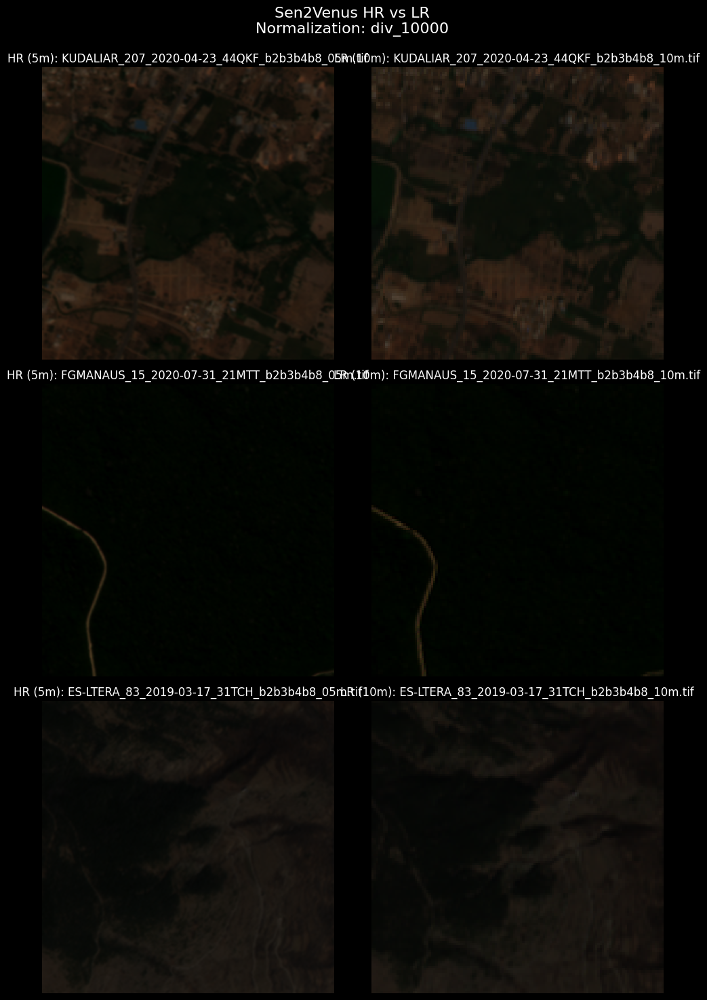

In [34]:
METHOD = 'div_10000'

visualize_specific_pairs(base_dir, files_to_check, method=METHOD)

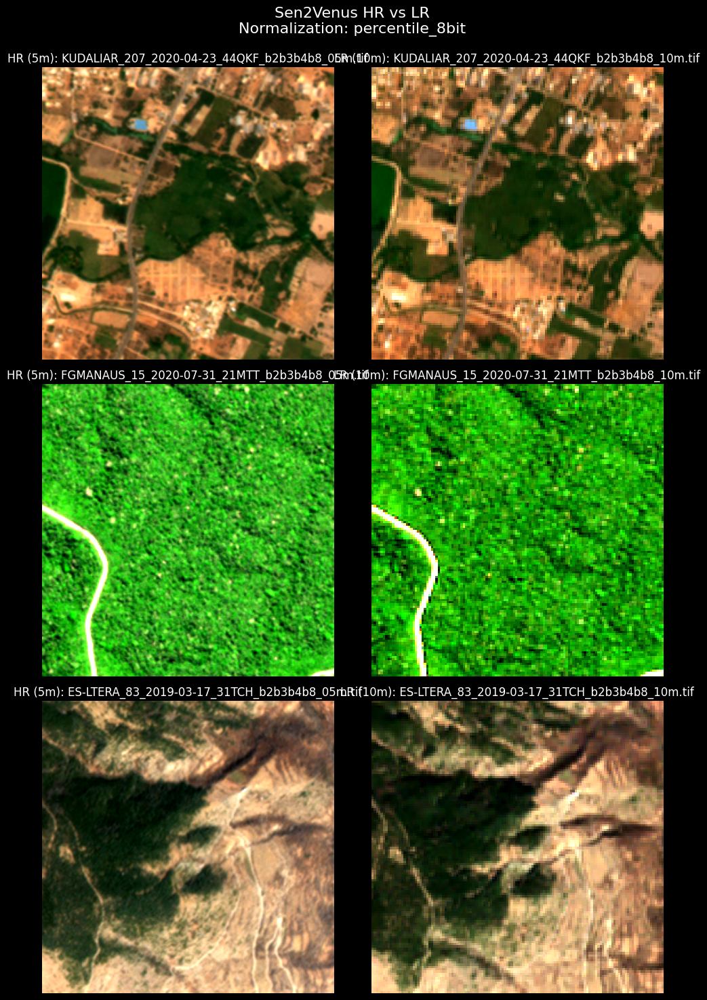

In [35]:
METHOD = 'percentile_8bit'

visualize_specific_pairs(base_dir, files_to_check, method=METHOD)

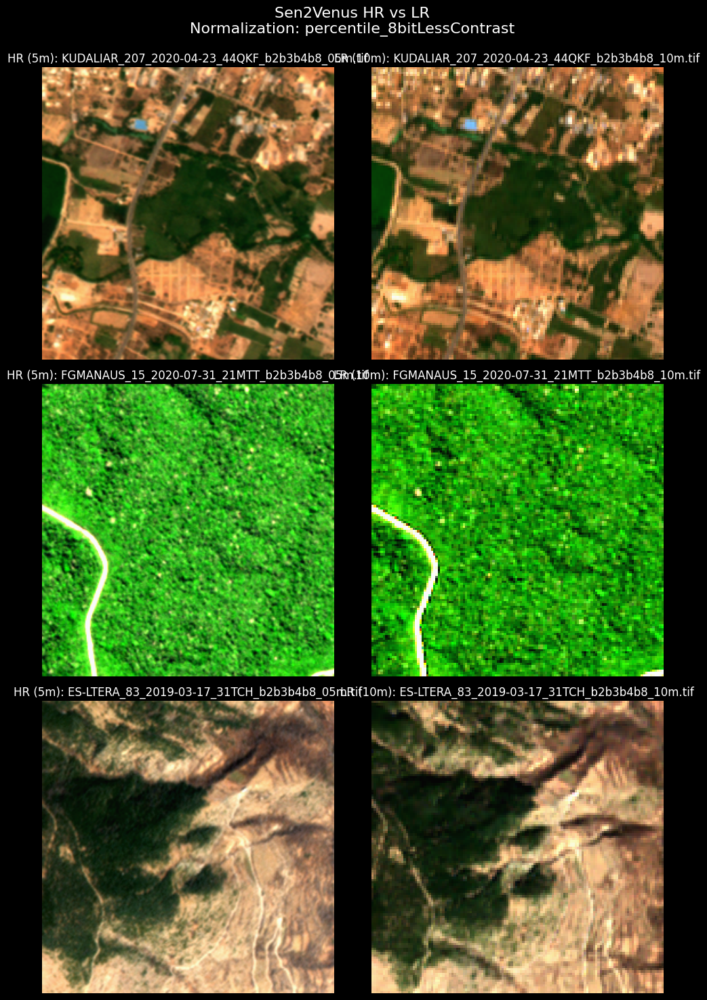

In [36]:
METHOD = 'percentile_8bitLessContrast'

visualize_specific_pairs(base_dir, files_to_check, method=METHOD)

Comparing: KUDALIAR at [2000, 2500, 3000, 4000]


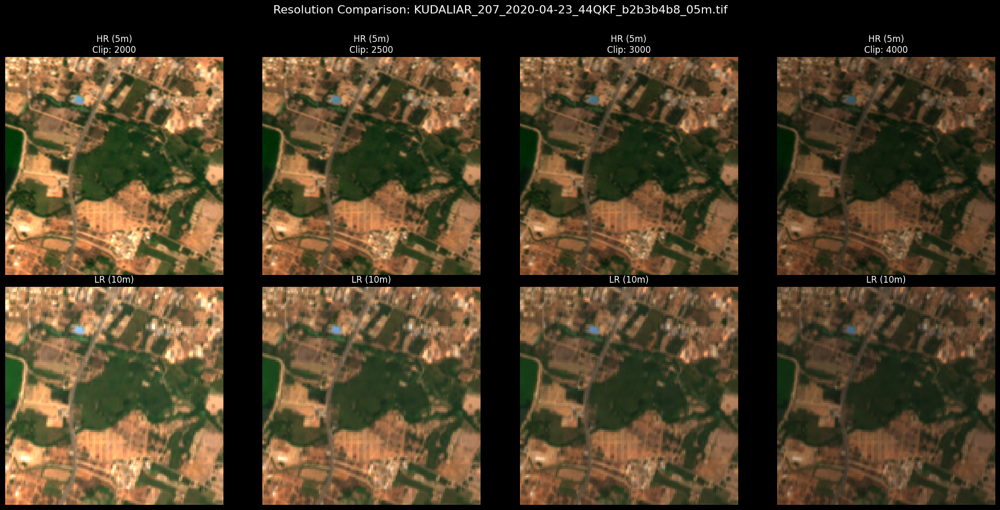

Comparing: FGMANAUS at [2000, 2500, 3000, 4000]


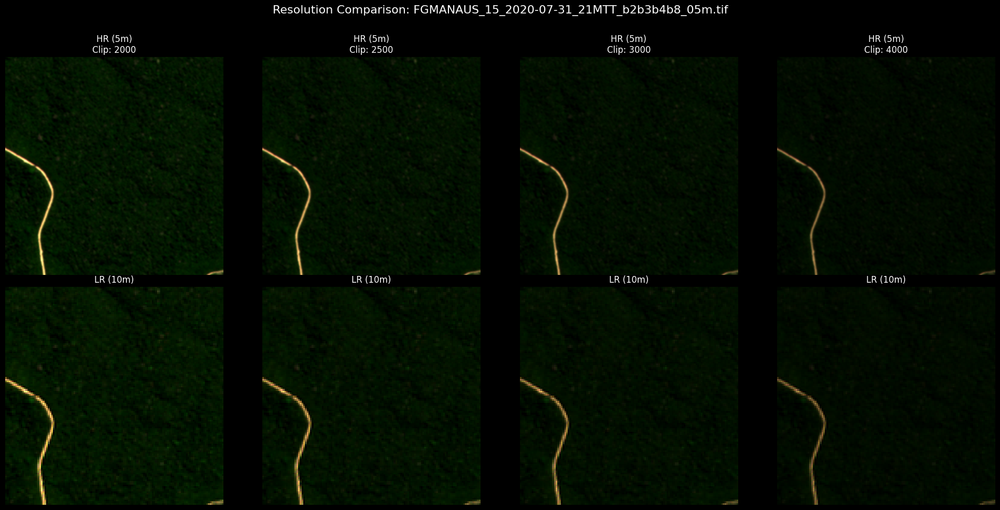

In [37]:
import os
import rasterio
import numpy as np
import matplotlib.pyplot as plt

def test_clipping_dual_res(path_5m, path_10m, clip_values=[2000, 3000, 4500]):
    """
    Displays HR and LR side-by-side across various clipping values.
    """
    fig, axes = plt.subplots(2, len(clip_values), figsize=(5 * len(clip_values), 10))
    fig.suptitle(f"Resolution Comparison: {os.path.basename(path_5m)}", fontsize=16)

    paths = [path_5m, path_10m]
    labels = ["HR (5m)", "LR (10m)"]

    for row_idx, (path, label) in enumerate(zip(paths, labels)):
        with rasterio.open(path) as src:
            # Sentinel-2 Bands: Red (3), Green (2), Blue (1) usually in B2B3B4B8 files
            # Check your band order: usually [B2, B3, B4, B8]
            # We want RGB: B4 (index 2), B3 (index 1), B2 (index 0)
            arr = src.read([1, 2, 3])
            rgb_raw = np.stack((arr[2], arr[1], arr[0]), axis=-1).astype(np.float32)

        for col_idx, val in enumerate(clip_values):
            ax = axes[row_idx, col_idx]

            # Apply Clipping and Scale to 8-bit
            clipped = np.clip(rgb_raw, 0, val)
            img_8bit = (clipped / val * 255).astype(np.uint8)

            ax.imshow(img_8bit)
            # Only show the clip value title on the top row
            title = f"{label}\nClip: {val}" if row_idx == 0 else label
            ax.set_title(title)
            ax.axis('off')

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

# ==========================================
# MAIN DRIVER
# ==========================================

def run_simultaneous_audit(base_dir, file_list, test_values=[2000, 2500, 3000, 4000]):
    """Iterates and opens both 5m and 10m versions."""
    for file_info in file_list:
        loc = file_info['loc']
        name_5m = file_info['name_5m']
        name_10m = name_5m.replace('_05m', '_10m') # Automatic name mapping

        path_5m = os.path.join(base_dir, loc, 'b2b3b4b8', '05m', name_5m)
        path_10m = os.path.join(base_dir, loc, 'b2b3b4b8', '10m', name_10m)

        if os.path.exists(path_5m) and os.path.exists(path_10m):
            print(f"Comparing: {loc} at {test_values}")
            test_clipping_dual_res(path_5m, path_10m, clip_values=test_values)
        else:
            print(f"Missing one of the pairs for {name_5m}")

# --- Execute ---
base_dir = r"D:\SUPARCO\SEN2VENµS"
files_to_check = [
    {'loc': 'KUDALIAR', 'name_5m': 'KUDALIAR_207_2020-04-23_44QKF_b2b3b4b8_05m.tif'},
    {'loc': 'FGMANAUS', 'name_5m': 'FGMANAUS_15_2020-07-31_21MTT_b2b3b4b8_05m.tif'}
]

run_simultaneous_audit(base_dir, files_to_check)